In [1]:
import os
import numpy as np 
import matplotlib.pyplot as plt
from obspy import read, UTCDateTime
from obspy.geodetics.base import gps2dist_azimuth

# Namjestite put do foldera u kojem su podatci
data_folder = "./DATA/"

In [2]:
# Učitajte podatake
stZ = read(os.path.join(data_folder,"waveforms_z.mseed"),format="MSEED")
#stN = read(os.path.join(data_folder,"waveforms_n.mseed"),format="MSEED")
#stE = read(os.path.join(data_folder,"waveforms_e.mseed"),format="MSEED")

In [3]:
# Ispišite informacije svakog stream-a
print(stZ); #print(stN); print(stE)

15 Trace(s) in Stream:
Y5.BH01A..HHZ | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 200.0 Hz, 720001 samples
Y5.BH04A..HHZ | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 200.0 Hz, 720001 samples
Y5.BH05A..HHZ | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 200.0 Hz, 720001 samples
Y5.BH06A..HHZ | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 200.0 Hz, 720001 samples
Y5.BH07A..HHZ | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 200.0 Hz, 720001 samples
CR.STON..HHZ  | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 50.0 Hz, 180001 samples
CR.DBRK..HHZ  | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 50.0 Hz, 180001 samples
DN.DF01..HHZ  | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 100.0 Hz, 360001 samples
DN.DF02..HHZ  | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.000000Z | 100.0 Hz, 360001 samples
DN.DF03..HHZ  | 2023-01-24T15:30:00.000000Z - 2023-01-24T16:30:00.0000

In [ ]:
# Odaberite jednu od tri komponente: z, n, e
comp = 'z'
# Učitajte podatke i nacrtajte prvih 5 min zapisa na svakoj od postaja
st = read(os.path.join(data_folder,"waveforms_"+comp+".mseed"),format='MSEED')

for k in range(0,len(st)): # k je redni broj postaje, 0,...,14
    t1 = st[k].stats.starttime # početak zapisa seizmograma
    win_len = 60 * 5 # duljina prozora koji razmatramo u s
    t2 = t1 + win_len # početno vrijeme + prozor

    st[k].plot(starttime=t1,endtime=t2)

In [ ]:
# Za odabranu komponentu crtamo seizmograme i njihove spektrograme
for k in range(0,len(st)):
    tr = st[k].trim(t1,t2) # izvlačimo po jedan trace iz streama i režemo ga
    t = np.arange(tr.stats.npts) / tr.stats.sampling_rate # definiramo vremensku os tako da kreće od nule

    fig = plt.figure(figsize=(20,10))
    ax1 = fig.add_axes([0.1, 0.75, 0.7, 0.2])
    ax2 = fig.add_axes([0.1, 0.1, 0.7, 0.60], sharex=ax1)
    ax3 = fig.add_axes([0.83, 0.1, 0.03, 0.6])

    ax1.plot(t, tr.copy().data, 'k')
    ax1.title.set_text(tr.stats.station)
    ax1.set_ylabel('Velocity (m/s)')

    tr.spectrogram(per_lap=0.95, dbscale=True, log=True, axes=ax2, cmap='jet')
    ax2.collections[0].set_clim(vmin=-280, vmax=-100)
    ax2.set_ylim((0.1,100))
    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('Frequency (Hz)')

    mappable = ax2.collections[0]
    cb = plt.colorbar(mappable=mappable, cax=ax3, ticks=np.arange(-320,0,20))
    cb.set_label('Power (dB/Hz)')

In [34]:
# Za svaki od potresa, odaberite jednu komponentu i izrežite zapis tako da započinje od hipocentralnog vremena
# Redni broj, hipocentralno vrijeme, magnituda i dubina žarišta potresa:
#j = 0: 2023-01-24T15:55:21.854, M 2.82, h = 6 km
#j = 1: 2023-01-24T15:57:27.769, M 0.76, h = 6 km
#j = 2: 2023-01-24T15:57:43.747, M 0.94, h = 2 km
#j = 3: 2023-01-24T16:04:05.300, M 2.70, h = 65 km
#j = 4: 2023-01-24T16:09:40.425, M 0.90, h = 5 km

# Učitavanje info o potresima
events = np.loadtxt(os.path.join(data_folder,"event_list.txt"),skiprows=1,delimiter=',',dtype='str')
hyp_time, M, late, lone, depth = events.T
j = 3 # redni broj događaja: 0, 1, 2, 3, 4

# Učitavanje info o postajama
stations = np.loadtxt(os.path.join(data_folder,"station_list.txt"),skiprows=1,delimiter=',',dtype='str')
loc, net, sta, lats, lons, ele = stations.T

# Učitavanje podataka i definiranje vremenskog prozora
comp = 'z' # komponenta koju razmatramo
st = read(os.path.join(data_folder,"waveforms_"+comp+".mseed"),format='MSEED')

t1 = UTCDateTime(hyp_time[j]) # hipocentralno vrijeme
win_len = 300 # duljina vremenskog prozora u s
t2 = t1 + win_len

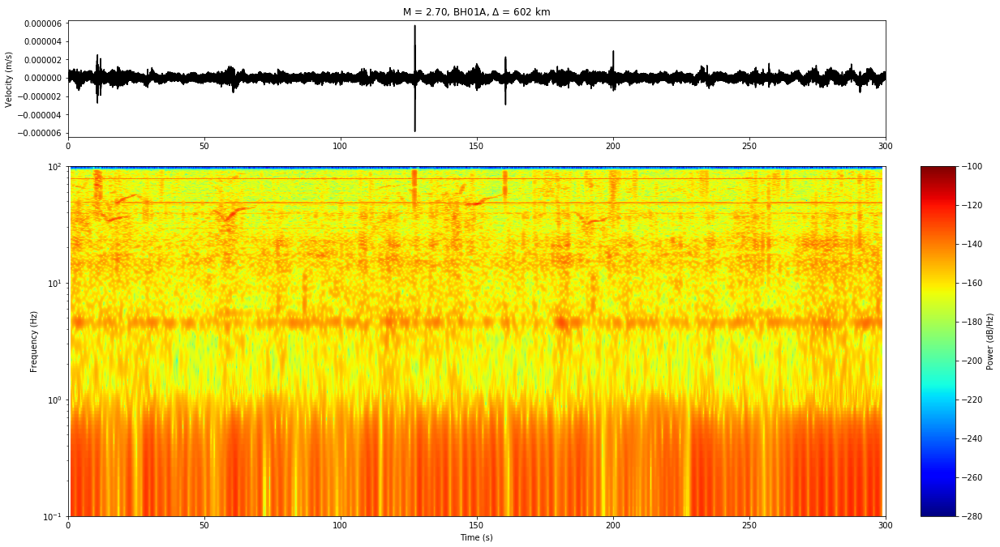

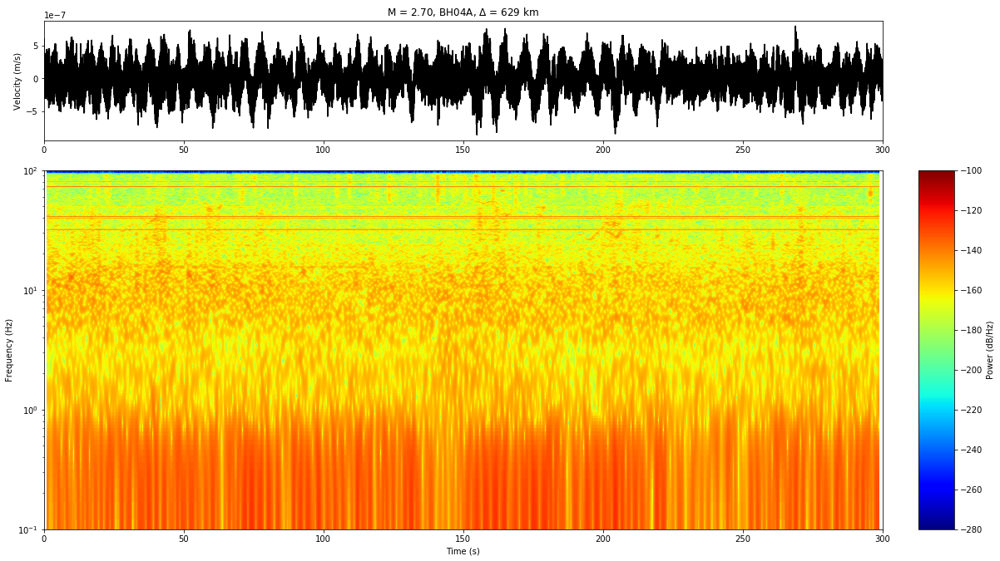

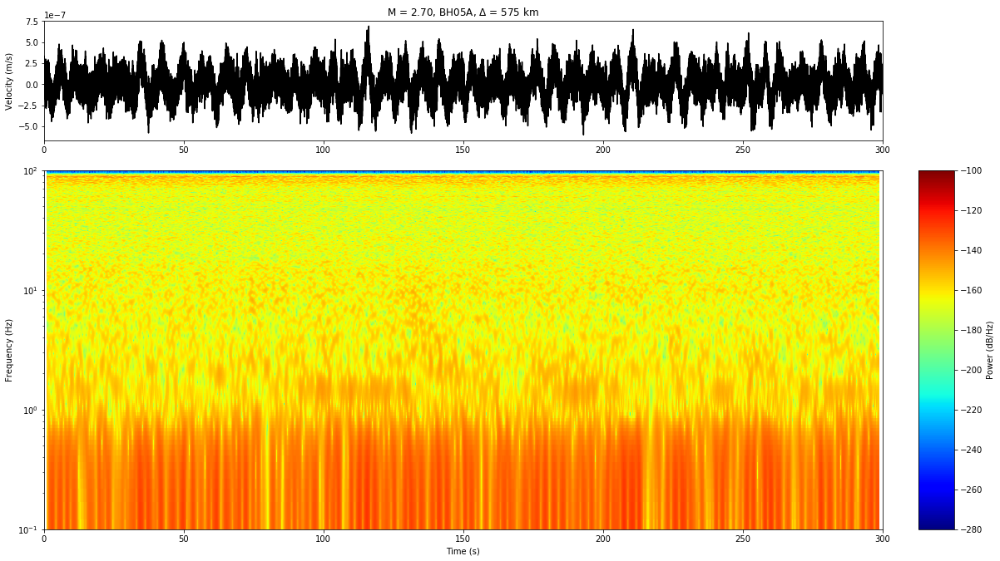

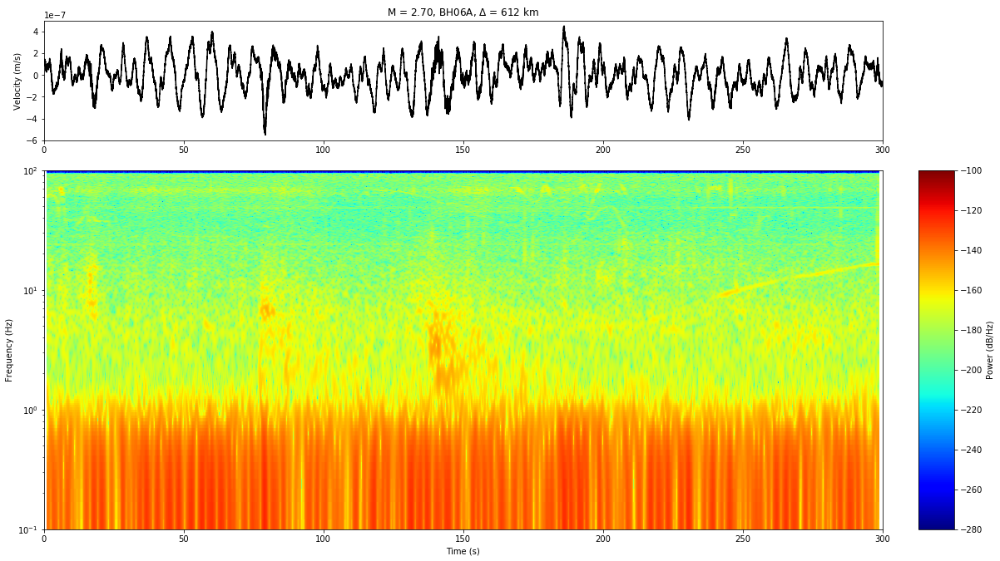

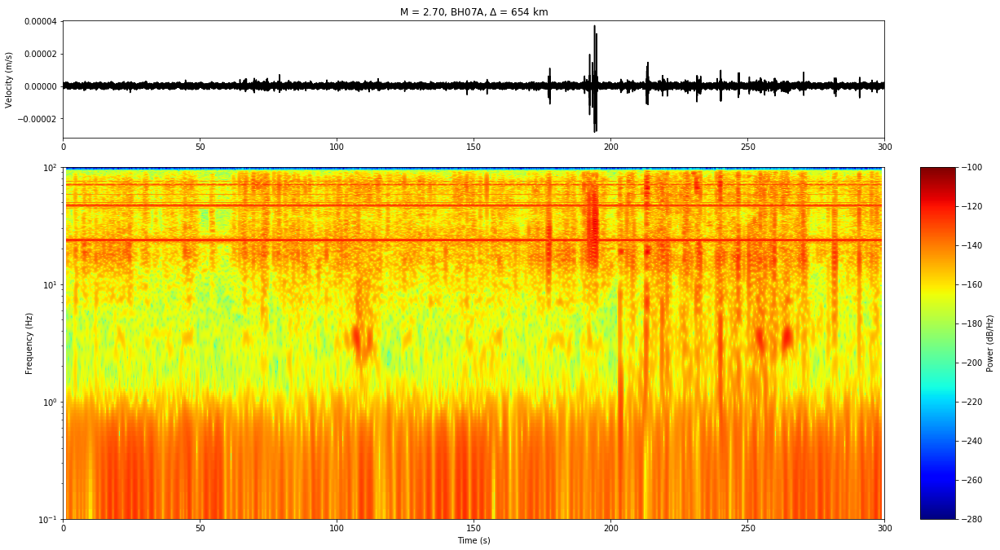

...

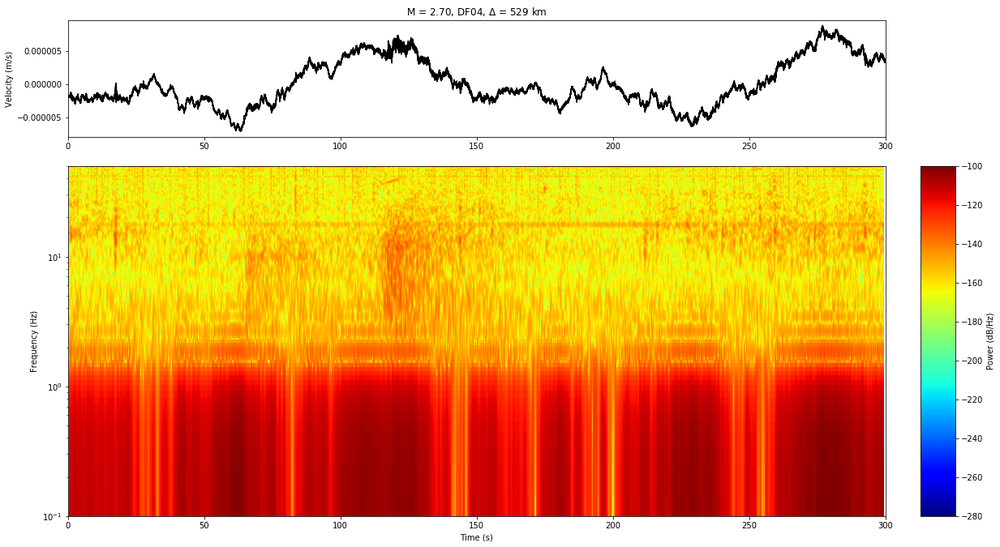

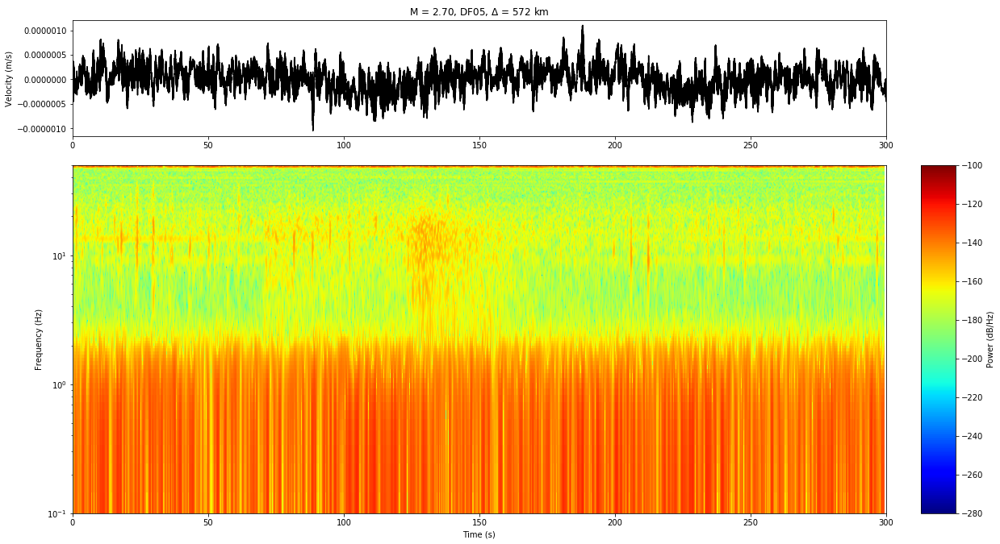

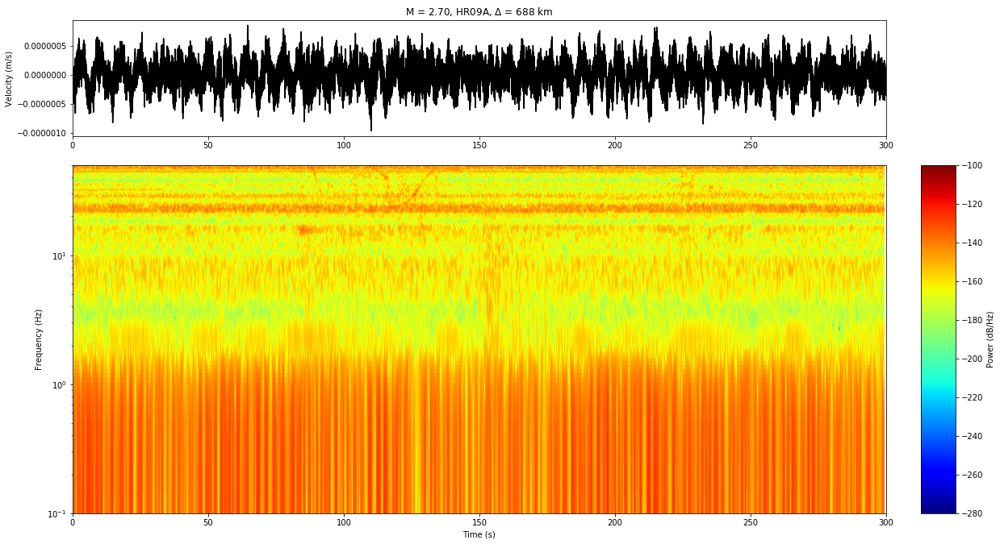

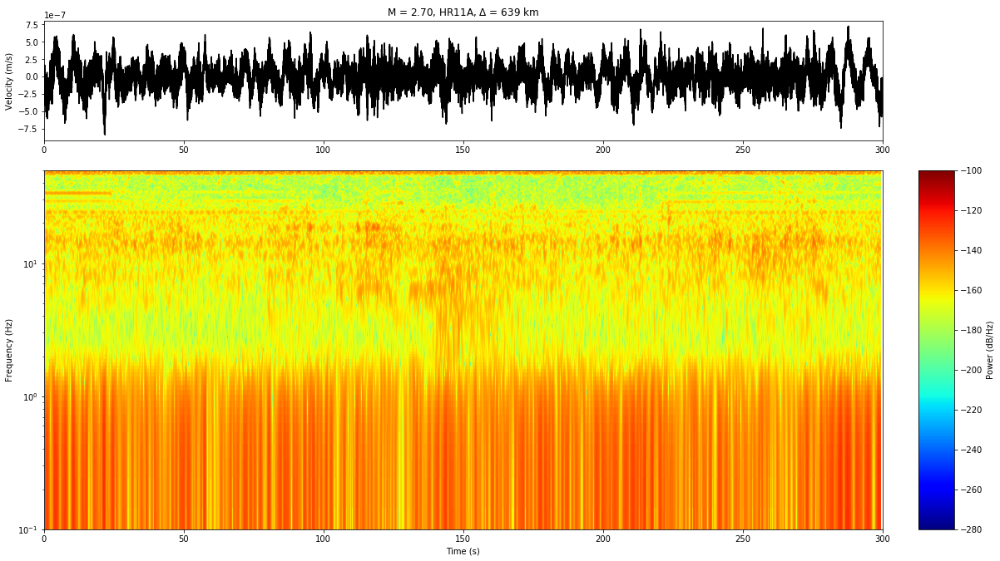

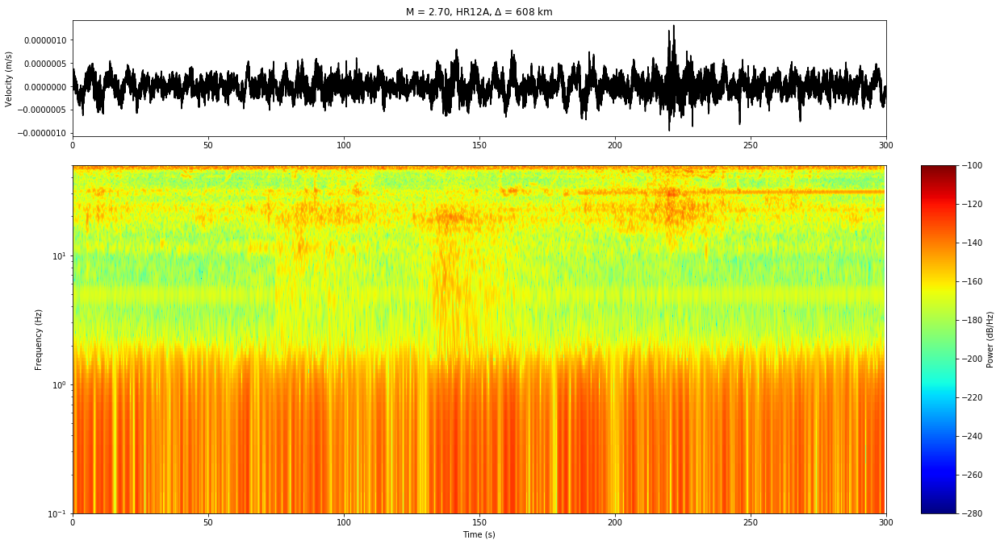

In [35]:
# Za odabrani potres i komponentu crtamo seizmograme i njihove spektrograme
for k in range(0,len(st)):
    baz = gps2dist_azimuth(float(late[j]), float(lone[j]), float(lats[k]), float(lons[k])) # računanje epicentralne udaljenosti
    
    tr = st[k].trim(t1,t2)
    t = np.arange(tr.stats.npts) / tr.stats.sampling_rate
    sps = st[k].stats.sampling_rate # uzorkovanje zapisa

    fig = plt.figure(figsize=(20,10))
    ax1 = fig.add_axes([0.1, 0.75, 0.7, 0.2])
    ax2 = fig.add_axes([0.1, 0.1, 0.7, 0.60], sharex=ax1)
    ax3 = fig.add_axes([0.83, 0.1, 0.03, 0.6])

    ax1.plot(t, tr.copy().data, 'k')
    ax1.title.set_text('M = '+M[j]+', '+tr.stats.station+', $\Delta$ = '+str(int(baz[0]/1000))+' km')
    ax1.set_ylabel('Velocity (m/s)')

    tr.spectrogram(per_lap=0.95, dbscale=True, log=True, axes=ax2, cmap='jet')
    ax2.collections[0].set_clim(vmin=-280, vmax=-100)
    ax2.set_ylim((0.1,sps/2))
    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('Frequency (Hz)')

    mappable = ax2.collections[0]
    cb = plt.colorbar(mappable=mappable, cax=ax3, ticks=np.arange(-320,0,20))
    cb.set_label('Power (dB/Hz)')
    fig.savefig("./slike/"+tr.stats.station+".png")

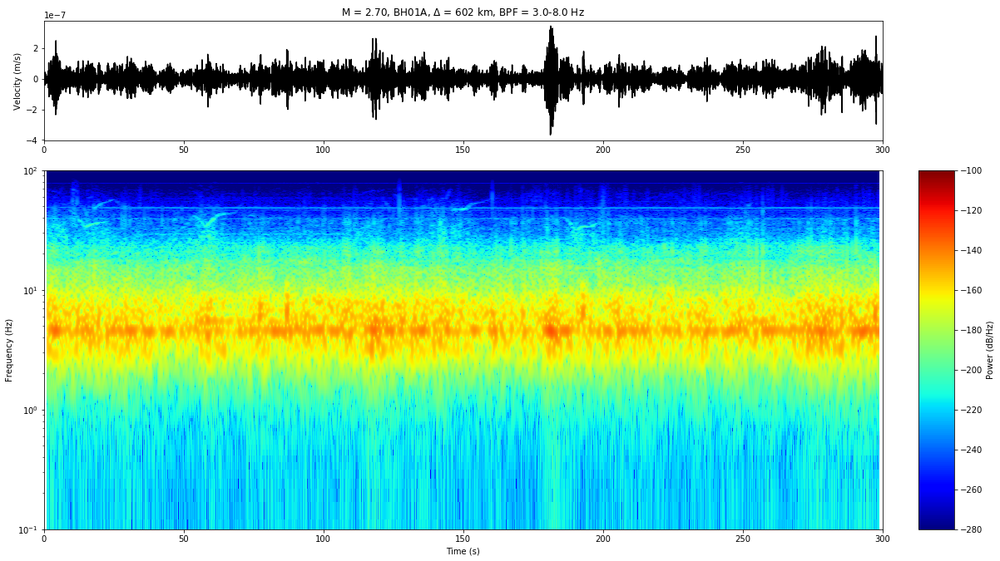

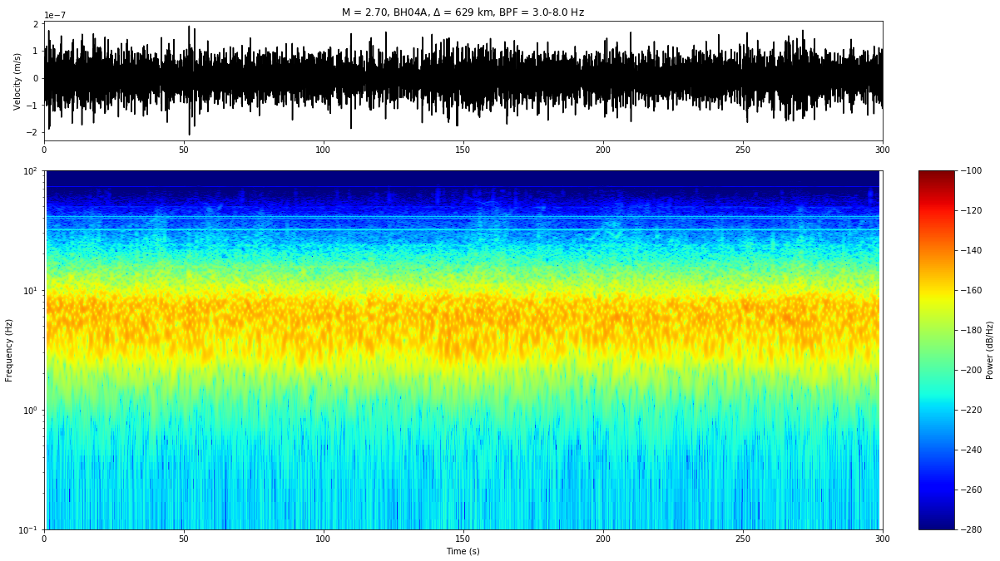

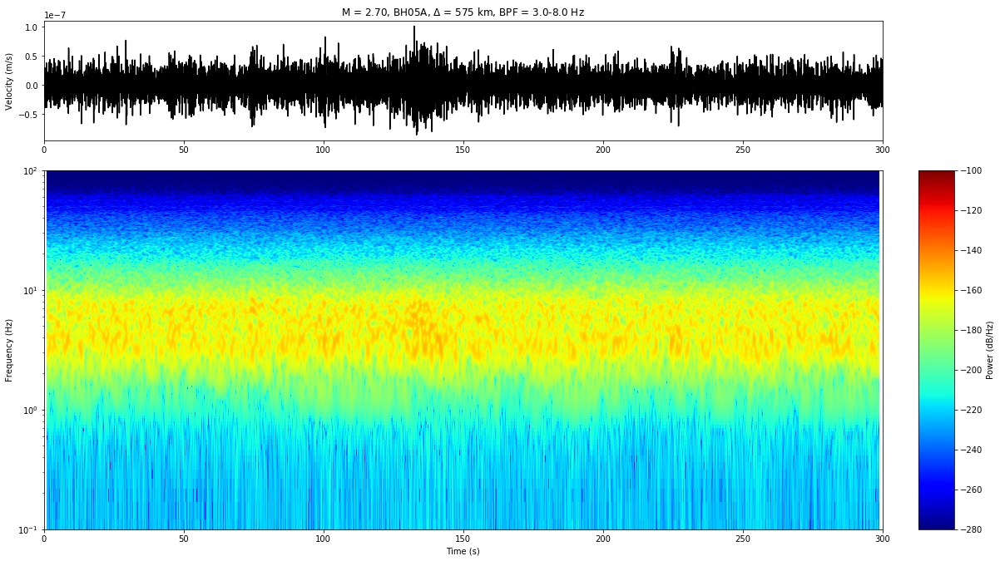

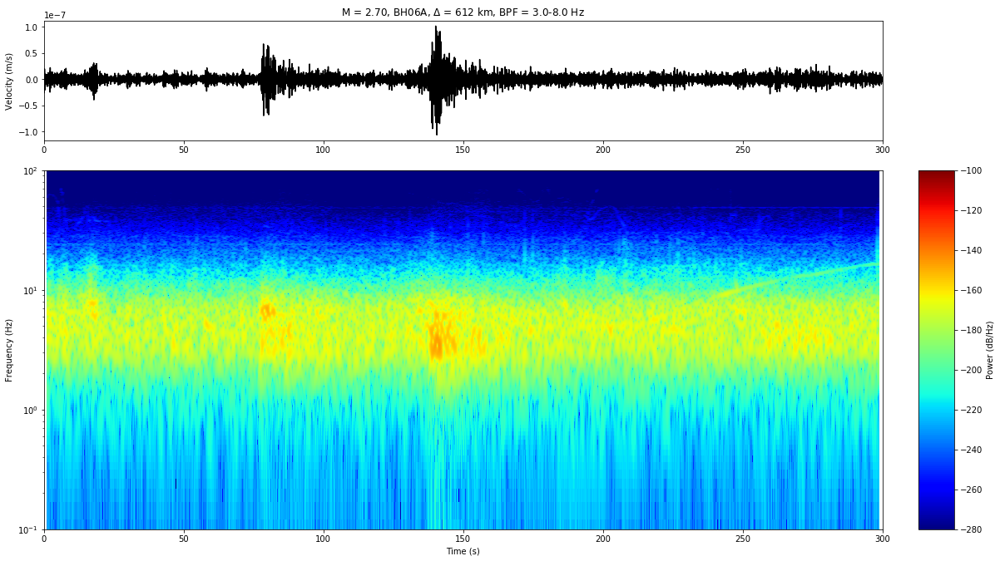

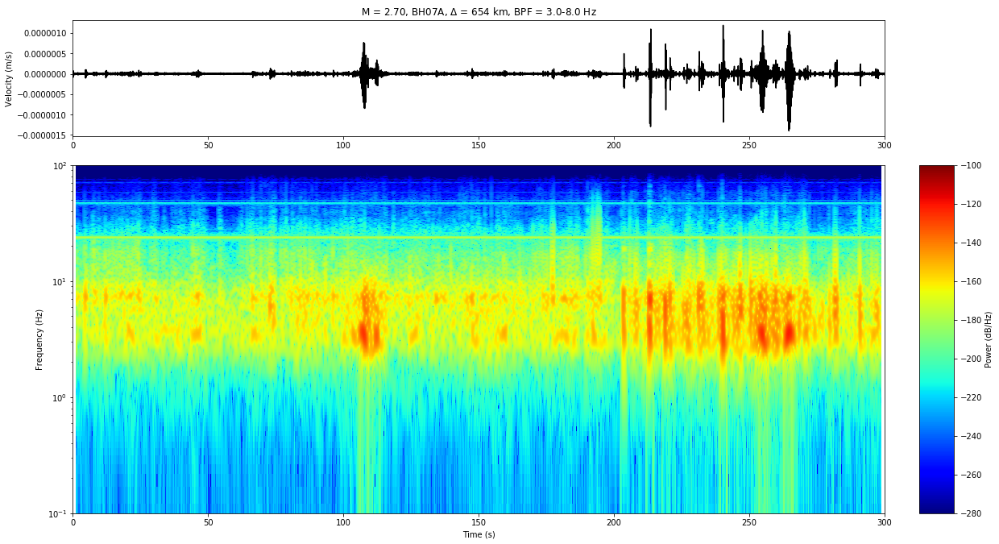

...

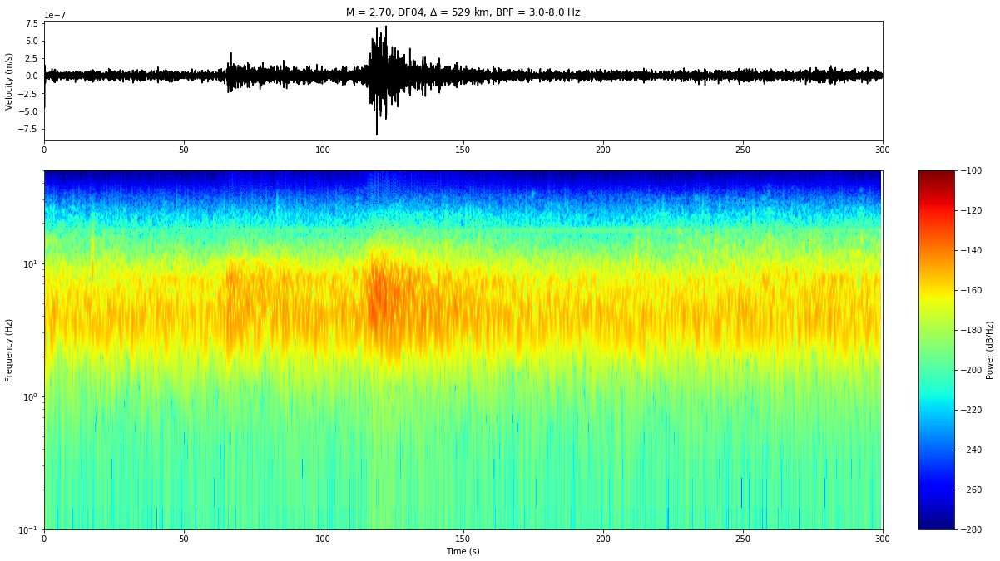

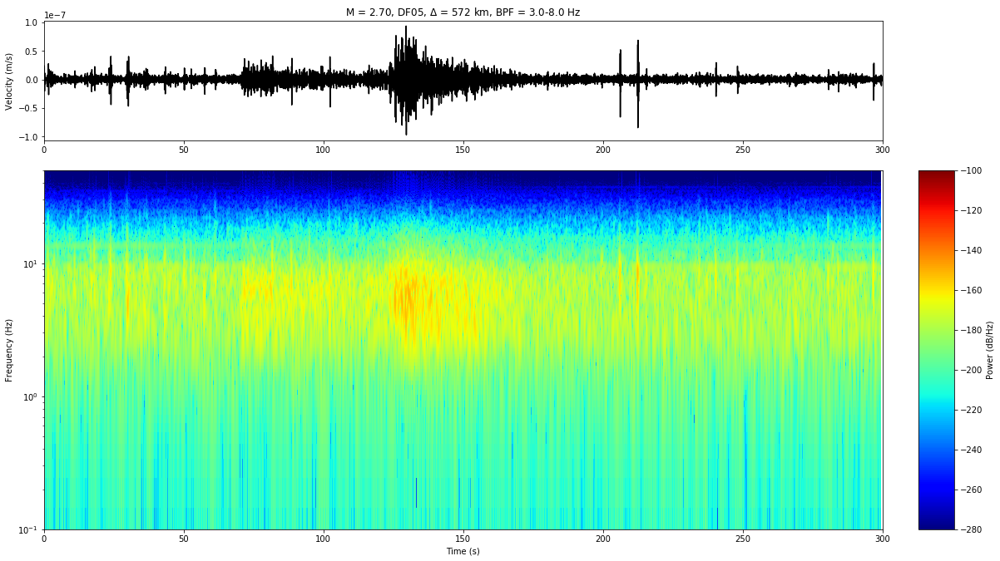

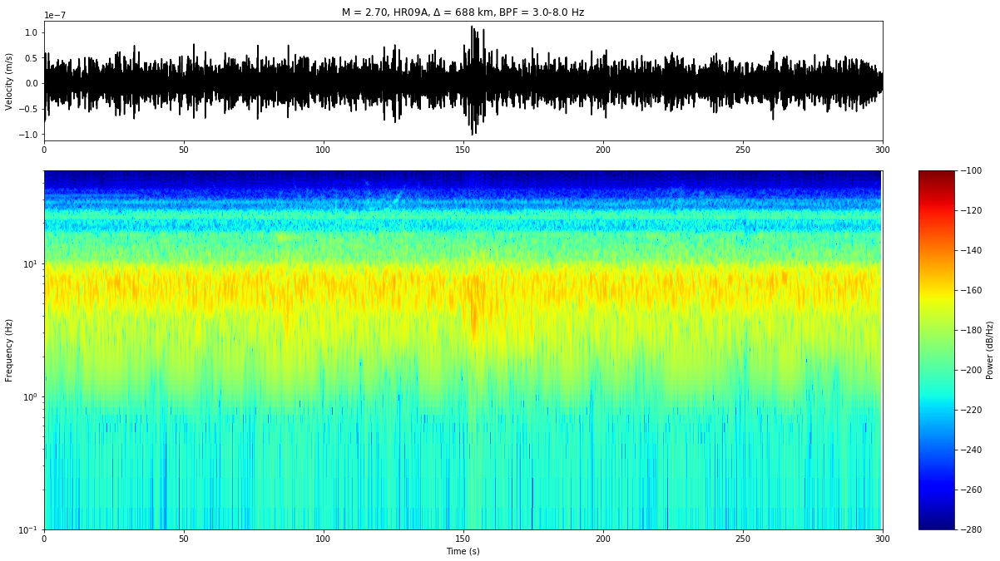

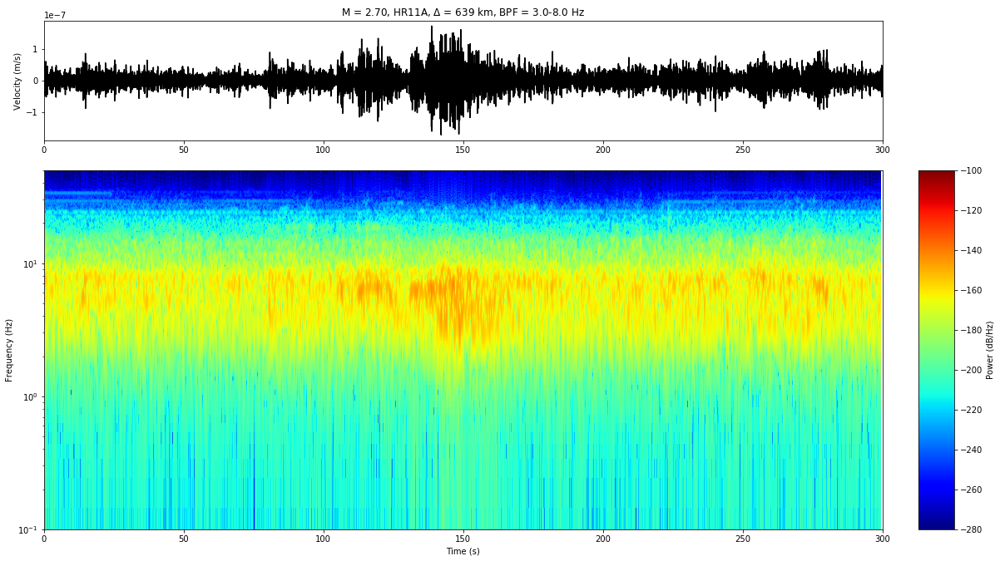

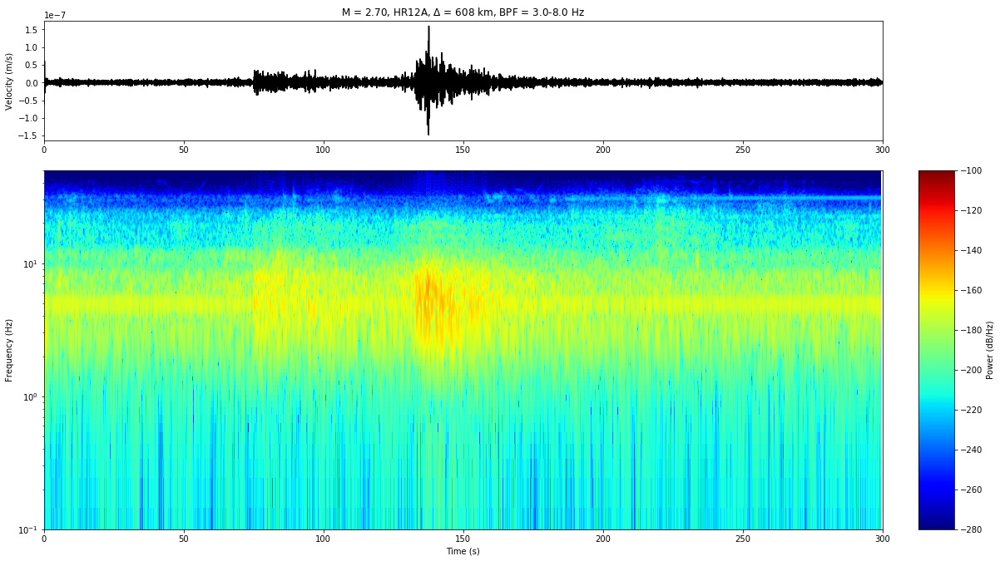

In [36]:
# Filtrirajte zapise s različitim širokopojasnim filtrima
# f0: 0.3 - 10 Hz 
# f0: 0.5 - 5.0 Hz
# f0: 3.0 - 8.0 Hz 
# f0: 0.5 - 20 Hz

fmin = 3.0 # donja granična frekvencija
fmax = 8.0 # gornja granična frekvencija
    
for k in range(0,len(st)):
    baz = gps2dist_azimuth(float(late[j]), float(lone[j]), float(lats[k]), float(lons[k])) # računanje epicentralne udaljenosti
    
    tr = st[k]#.trim(t1-22,t2+50)
    tr.filter("bandpass", freqmin=fmin, freqmax=fmax)
    tr.trim(t1,t2)
    t = np.arange(tr.stats.npts) / tr.stats.sampling_rate
    sps = st[k].stats.sampling_rate # uzorkovanje zapisa

    fig = plt.figure(figsize=(20,10))
    ax1 = fig.add_axes([0.1, 0.75, 0.7, 0.2])
    ax2 = fig.add_axes([0.1, 0.1, 0.7, 0.60], sharex=ax1)
    ax3 = fig.add_axes([0.83, 0.1, 0.03, 0.6])

    ax1.plot(t, tr.copy().data, 'k')
    ax1.title.set_text('M = '+M[j]+', '+tr.stats.station+', $\Delta$ = '+str(int(baz[0]/1000))+' km'\
                      +', BPF = '+str(fmin)+'-'+str(fmax)+' Hz')
    ax1.set_ylabel('Velocity (m/s)')

    tr.spectrogram(per_lap=0.95, dbscale=True, log=True, axes=ax2, cmap='jet')
    ax2.collections[0].set_clim(vmin=-280, vmax=-100)
    ax2.set_ylim((0.1,sps/2))
    #ax2.set_ylim((fmin,fmax)) 
    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('Frequency (Hz)')

    mappable = ax2.collections[0]
    cb = plt.colorbar(mappable=mappable, cax=ax3, ticks=np.arange(-320,0,20))
    cb.set_label('Power (dB/Hz)')
    fig.savefig("./slike/"+tr.stats.station+"f1.png")